**Topic 1: Introduction to Pooling & Why It Is Needed**

---

### 1. Introduction

**What is Pooling?**  
Pooling is a layer added in a Convolutional Neural Network (CNN) **right after the convolution layer**. It is a **downsampling operation** – meaning it reduces the spatial size (height & width) of the feature map that comes out of the convolution layer.

**Why is it important?**  
Pooling solves two major problems that arise after convolution:
- **Memory issues** – feature maps become too large and crash your program.
- **Translation variance** – convolution detects features but ties them to specific locations; pooling makes the model location‑agnostic (translation invariant).

**Real‑life use:**  
Almost every modern CNN (e.g., VGG, ResNet) uses pooling to keep computations manageable and to make the network focus on **whether** a feature exists, not **where** it exists – crucial for tasks like image classification, object detection, and face recognition.

---

### 2. Detailed Explanation

#### Problem 1: Memory Explosion
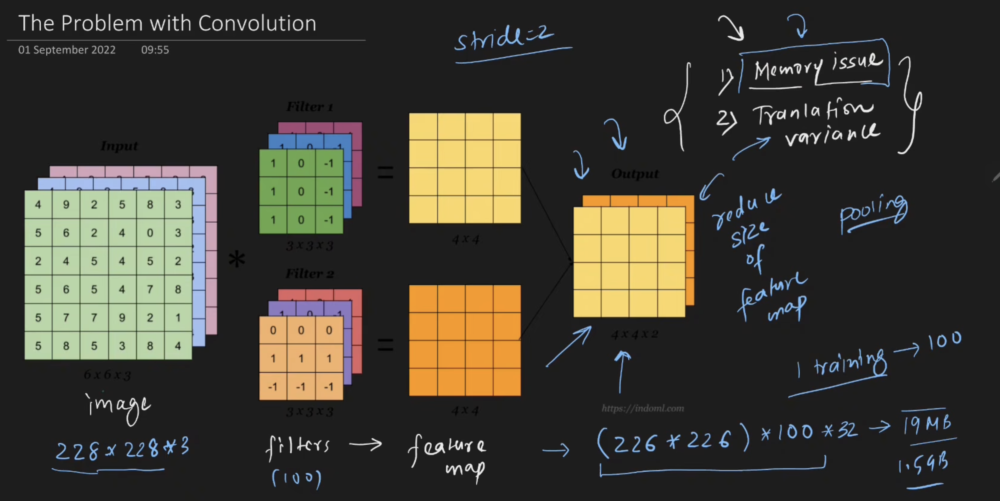
- Suppose you have an input image of size **228×228** and you apply **100 filters** in a convolution layer.
- The output feature map size will be roughly **226×226×100** (depending on padding/stride).
- If you store each number as a **32‑bit float** (4 bytes), the memory required is:  
  `226 × 226 × 100 × 4 bytes ≈ 20.4 MB` – that’s for **one** training example.  
  For a full batch, this can blow up to **~1.5 GB** or more.
- Pooling reduces this by **half or more** (e.g., 226×226 becomes 113×113), drastically cutting memory usage.

#### Problem 2: Translation Variance vs. Invariance
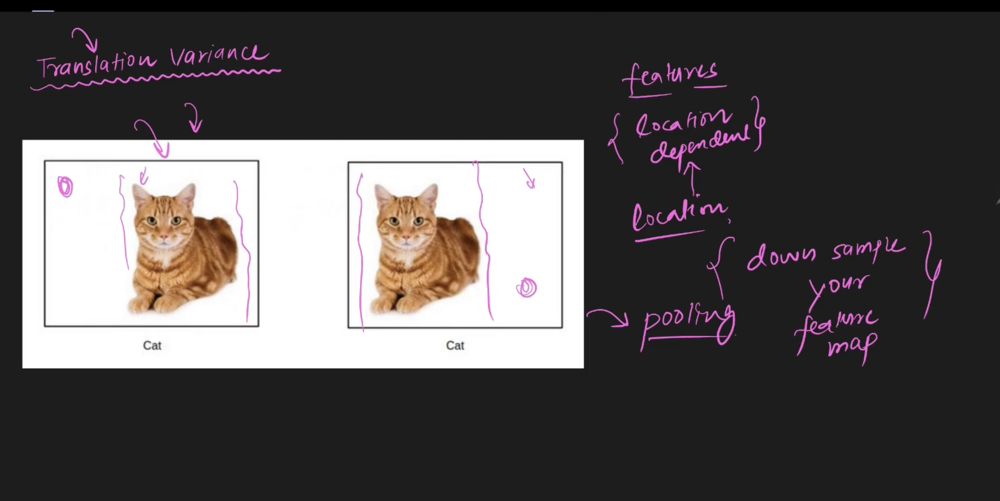
- **Convolution** detects features (edges, eyes, ears) but their position in the feature map depends on where they appear in the image.
- If a cat’s ear is at the top‑left, the feature appears at one location; if the cat moves to the bottom‑right, the same feature appears elsewhere.
- For tasks like **image classification** (cat vs. dog), location doesn’t matter – only the presence of the feature matters.
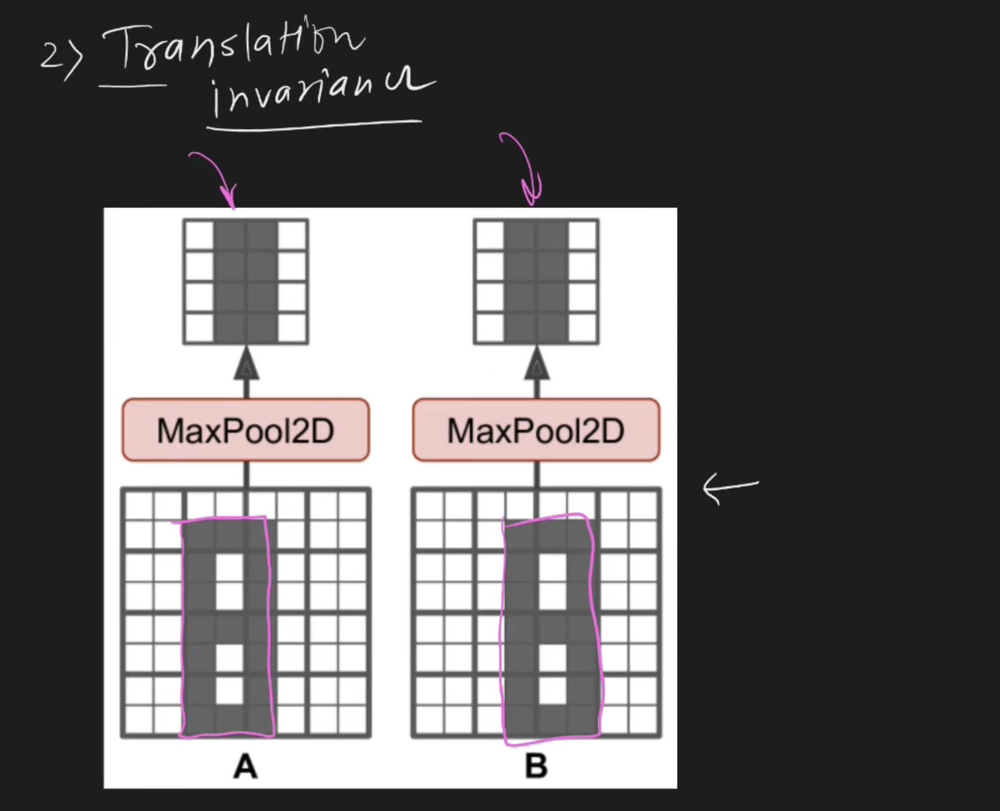
- Pooling downsamples the feature map, so small shifts in location get “smoothed out.” The network becomes **translation invariant** – it treats the feature the same regardless of where it is.

#### How Pooling Works (Intuition)
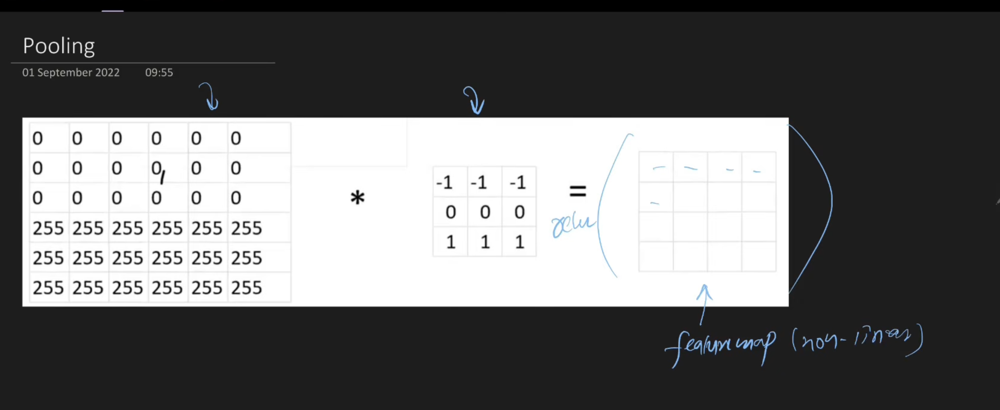
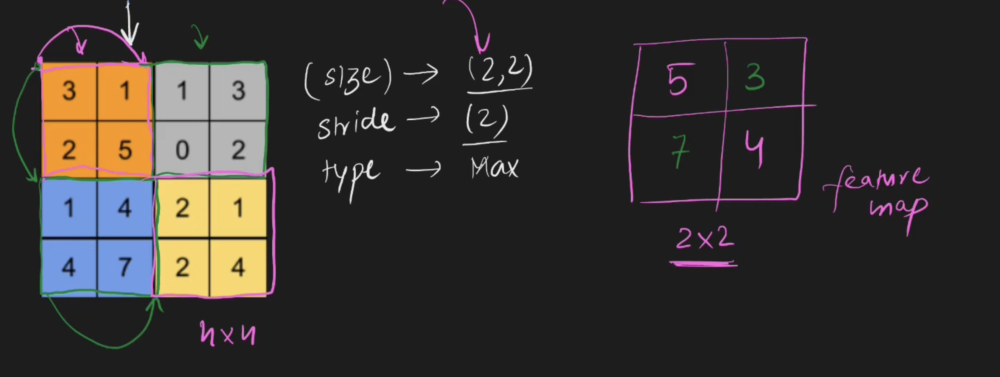
- Pooling slides a **window** (e.g., 2×2) over the feature map with a certain **stride** (step size, typically 2).
- In each window, it applies an **aggregation operation** – e.g., taking the **maximum** value (MaxPooling) or the **average** (AveragePooling).
- The result is a smaller feature map that keeps only the most dominant or representative information from each local region.
- Think of it as “zooming out” – you keep the big picture (high‑level features) and discard fine details that are less important for the final task.

---

### 3. Key Points

- Pooling is a **downsampling** layer placed after convolution.
- It reduces the **spatial size** (height × width) of feature maps.
- It makes the model **translation invariant** – location of feature becomes less important.
- It drastically reduces **memory and computation** requirements.
- Pooling has **no trainable parameters** – it’s a fixed operation (max or average).
- The most common type is **MaxPooling**.
- Pooling is applied **independently on each feature map** (depth remains unchanged).

---

### 4. Common Mistakes

| Mistake | Why it’s wrong | How to avoid |
|---------|---------------|---------------|
| Thinking pooling reduces the number of filters (depth) | Pooling only reduces height & width; depth (number of channels) stays the same. | Remember: pooling works on each channel separately. |
| Using pooling when location *does* matter | For tasks like image segmentation, pooling can lose important positional information. | Use pooling only for tasks where global presence matters (classification, detection) – not for pixel‑wise tasks. |
| Confusing stride with filter size | Stride is how much you slide; filter size is the window size. Both affect output size. | Always define both clearly: e.g., `pool_size=2, strides=2`. |
| Believing pooling has weights to learn | Pooling is just an aggregate (max/average) – no backpropagation updates. | Check model summary – you’ll see 0 trainable parameters for pooling layers. |

---

### 5. Revision Notes (Quick Recap)

- **Pooling = downsampling** after convolution.
- Solves **memory** and **translation variance** problems.
- **MaxPooling**: takes maximum value in each window – enhances dominant features.
- **AveragePooling**: takes average – smoother, less common.
- **No parameters to learn** – just an aggregation.
- Reduces size (e.g., 226×226 → 113×113 with 2×2 window, stride 2).
- Applied per feature map – depth unchanged.

---



**Topic 2: MaxPooling in Detail – Operation, Types, and Intuition**

---

### 1. Introduction

**What is MaxPooling?**  
MaxPooling is the most widely used pooling operation. It slides a window (e.g., 2×2) over the feature map and **takes the maximum value** from each window. Everything else in that window is discarded.

**Why is it so popular?**  
Because it not only downsamples (saving memory) but also **enhances the most dominant features** in each local region. This makes the network focus on what's important – e.g., the strongest edge, the brightest corner – and ignore weaker, less relevant details.

**Real‑life use:**  
Almost every classic CNN (AlexNet, VGG, ResNet) uses MaxPooling after convolution blocks to progressively reduce spatial size while preserving the strongest activations.

---

### 2. Detailed Explanation
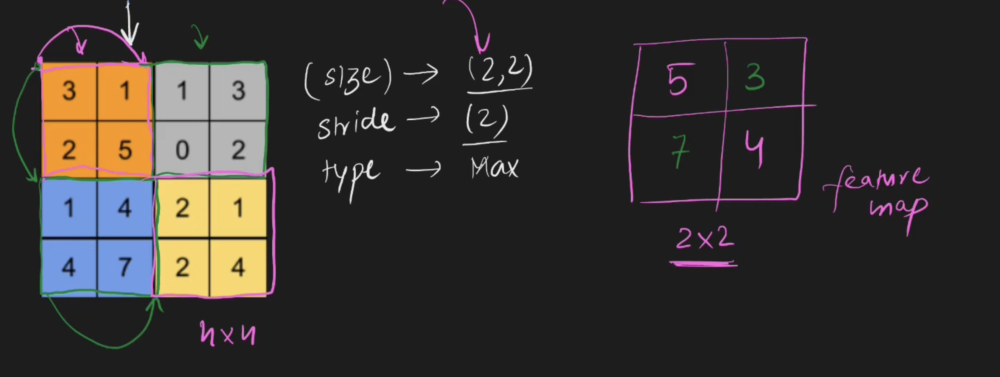
#### Step‑by‑Step Operation (with Example)

Imagine you have a **4×4** feature map (numbers represent activation values after ReLU):

```
| 1 | 3 | 2 | 4 |
| 5 | 6 | 1 | 2 |
| 0 | 7 | 8 | 3 |
| 2 | 1 | 4 | 9 |
```

You apply **MaxPooling** with:
- **Filter size (pool size)** = 2×2
- **Stride** = 2 (non‑overlapping windows)

**Step 1:** Take the top‑left 2×2 window:
```
| 1 | 3 |
| 5 | 6 |
```
Maximum = **6** → output at position (0,0).

**Step 2:** Slide the window by stride 2 to the right – top‑right 2×2:
```
| 2 | 4 |
| 1 | 2 |
```
Maximum = **4** → output at (0,1).

**Step 3:** Move down by stride 2 – bottom‑left 2×2:
```
| 0 | 7 |
| 2 | 1 |
```
Maximum = **7** → output at (1,0).

**Step 4:** Bottom‑right 2×2:
```
| 8 | 3 |
| 4 | 9 |
```
Maximum = **9** → output at (1,1).

**Resulting feature map (2×2):**
```
| 6 | 4 |
| 7 | 9 |
```

The original 4×4 (16 numbers) is reduced to 2×2 (4 numbers) – a **75% reduction** in size.

#### Intuition Behind MaxPooling
- Think of each window as a **local receptive field**.
- In that small area, there are various feature strengths (numbers).
- MaxPooling **picks the strongest activation** – the most “alert” neuron.
- By doing this everywhere, you keep only the **most prominent features** (high‑level patterns) and discard **low‑level details** (noise, weak edges).
- This also creates **translation invariance**: if a feature shifts slightly within the window, the max value often remains the same, so the output doesn't change.

#### How MaxPooling Achieves Translation Invariance
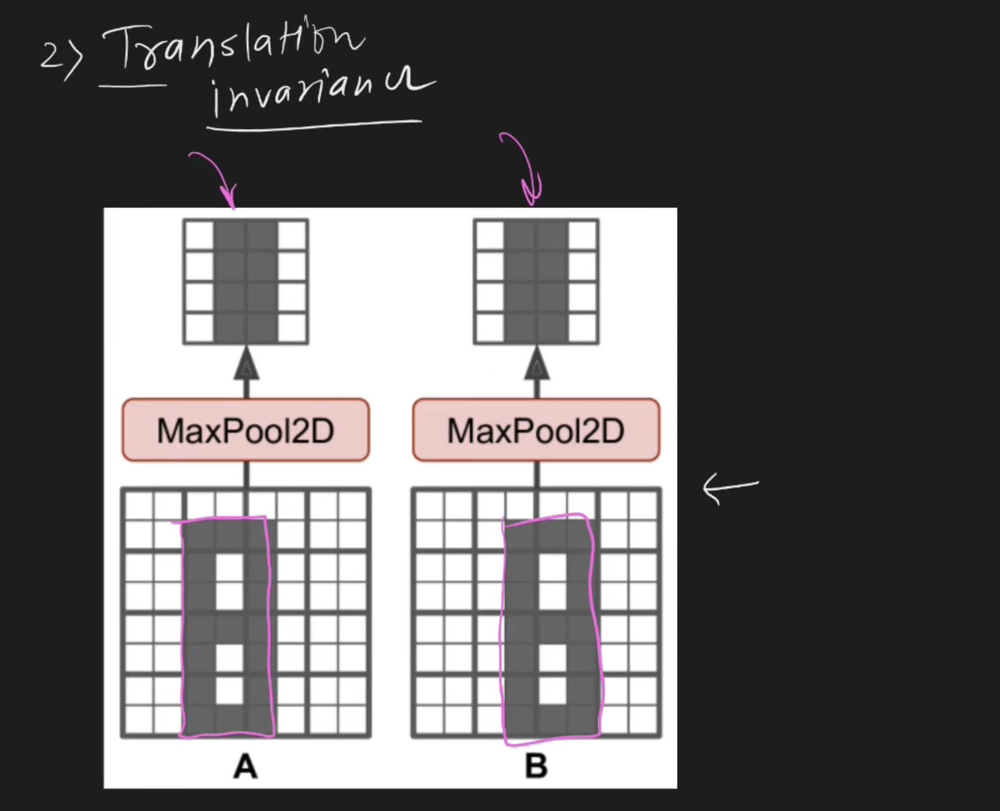
- Suppose a cat's eye feature activates strongly at position (2,3) in one image and at (3,4) in another (shifted).
- Without pooling, these would be treated as different locations → different feature vectors.
- With MaxPooling, both activations fall within the same 2×2 window (or adjacent windows if stride is small). The max value is still high and ends up in the same output cell.
- Thus, the network **ignores small shifts** and focuses on **presence** of the feature.

#### Types of Pooling (Brief Overview)

| Type | Operation | When to use |
|------|-----------|-------------|
| **MaxPooling** | Takes maximum | Most common; enhances dominant features |
| **AveragePooling** | Takes average of all values | Smoother; used when you want to retain background info |
| **Global Max/Average Pooling** | Takes max/average over the **entire** feature map (per channel) | Used at the end of CNN to replace fully connected layers; reduces overfitting |

---

### 3. Key Points

- MaxPooling: select **maximum** value in each pooling window.
- Pool size and stride are hyperparameters (typically 2×2 with stride 2).
- It **reduces spatial size** (height & width) but **keeps depth** (number of channels) unchanged.
- It introduces **translation invariance** – small positional changes don’t affect output.
- It **enhances** the most dominant features and suppresses weaker ones.
- It has **zero trainable parameters** – just a fixed mathematical operation.

---

### 4. Syntax / Structure (as seen in code)

In frameworks like Keras/TensorFlow, MaxPooling is added as a layer:

```python
from tensorflow.keras.layers import MaxPooling2D

model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
```

**Line‑by‑line explanation:**
- `MaxPooling2D` – the layer type for 2D image data.
- `pool_size=(2,2)` – the window size (height, width). Common: (2,2).
- `strides=(2,2)` – how many pixels to move the window each step. Often equal to pool_size to avoid overlap.

If you omit `strides`, it defaults to `pool_size`.

---

### 5. Code Example (Simple to Advanced)

**Example 1: Basic MaxPooling on a single feature map**

```python
import numpy as np
from tensorflow.keras.layers import MaxPooling2D

# Create a 4x4 feature map (simulated)
feature_map = np.array([[1, 3, 2, 4],
                        [5, 6, 1, 2],
                        [0, 7, 8, 3],
                        [2, 1, 4, 9]])

# Reshape to (batch_size, height, width, channels) -> (1,4,4,1)
feature_map = feature_map.reshape(1, 4, 4, 1)

# Apply MaxPooling with pool_size=2, stride=2
pool_layer = MaxPooling2D(pool_size=(2,2), strides=(2,2))
output = pool_layer(feature_map)

print("Output after MaxPooling:\n", output.numpy().squeeze())
```

**Output:**
```
[[6. 4.]
 [7. 9.]]
```
*Explanation:* As we calculated manually – each 2×2 block becomes its max value.

---

**Example 2: MaxPooling in a full CNN model (Keras)**

```python
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(28,28,1)),  # Output: 26x26x32
    MaxPooling2D(pool_size=(2,2), strides=(2,2)),                # Output: 13x13x32
    Conv2D(64, (3,3), activation='relu'),                        # Output: 11x11x64
    MaxPooling2D(pool_size=(2,2), strides=(2,2)),                # Output: 5x5x64
    Flatten(),
    Dense(10, activation='softmax')
])

model.summary()
```

**Observe:**  
- After first MaxPooling: 26×26 → 13×13 (size halved).  
- After second MaxPooling: 11×11 → 5×5 (size roughly halved).  
- **Trainable parameters:** Only from Conv2D and Dense layers – pooling layers show **0 parameters**.

---

### 6. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
|---------|---------------|---------------|
| Using stride=1 with pool_size=2 | Output size barely reduces; defeats purpose of downsampling. | Use stride equal to pool_size (or larger) for meaningful reduction. |
| Expecting pooling to reduce depth | Pooling operates per channel – depth stays the same. | Remember: only height and width change. |
| Applying pooling before ReLU | Pooling on negative values can pick the least negative – not meaningful. | Always apply ReLU **before** pooling to have non‑negative activations. |
| Thinking MaxPooling learns patterns | It doesn't learn – it's just a fixed operation. | Check `model.summary()` – 0 parameters for pooling layers. |

---

### 7. Interview / Exam Questions

**Q1:** Why is MaxPooling preferred over AveragePooling in most CNNs?  
**A:** MaxPooling picks the strongest activation, which helps the network focus on the most salient features and provides better translation invariance. AveragePooling smooths everything and can dilute important signals.

**Q2:** If you have a 32×32 feature map and apply MaxPooling with pool_size=2 and stride=2, what is the output size?  
**A:** 16×16 (each dimension is divided by 2).

**Q3:** What happens to the number of channels (depth) after MaxPooling?  
**A:** It remains unchanged because pooling is applied independently to each channel.

**Q4:** Does MaxPooling have any trainable parameters? Why?  
**A:** No. It's a fixed aggregation operation (max) – there are no weights to update via backpropagation.

---

### 8. Revision Notes (Quick Recap)

- **MaxPooling** = take max in each window → keeps dominant features.
- Parameters: `pool_size` (window size) and `strides` (step size).
- Output size formula (for square): `out = floor((input - pool_size) / stride) + 1`.
- **No learnable parameters** – fast and memory‑efficient.
- Provides **translation invariance** – small shifts don't change output.
- Always apply **after activation (ReLU)** to have positive values.
- Most common setting: 2×2 window, stride 2 → reduces size by half.

---



**Topic 3: AveragePooling, Global Pooling, and Pooling on Volumes (Multiple Feature Maps)**

---

### 1. Introduction

**What are these variants?**  
Besides MaxPooling, there are other pooling operations:
- **AveragePooling** – takes the average of all values in each window instead of the maximum.
- **Global Pooling** – takes the maximum or average over the **entire spatial dimension** (whole height × width) of each feature map, producing just **one number per channel**.

**Why are they useful?**  
- AveragePooling is used when you want a smoother downsampling that retains background context.
- Global Pooling is often used **at the end of a CNN** to replace fully connected layers, drastically reducing parameters and preventing overfitting.

**Real‑life use:**  
- AveragePooling appears in some classic architectures (e.g., LeNet-5).
- Global Average Pooling is famously used in **ResNet** and **DenseNet** as the final layer before classification.

---

### 2. Detailed Explanation

#### A. AveragePooling (Mean Pooling)

**How it works:**  
Exactly like MaxPooling, but instead of taking the maximum value in the 2×2 (or other size) window, you calculate the **average** of all numbers in that window.

**Example using the same 4×4 feature map:**

```
| 1 | 3 | 2 | 4 |
| 5 | 6 | 1 | 2 |
| 0 | 7 | 8 | 3 |
| 2 | 1 | 4 | 9 |
```

With **AveragePooling** (pool_size=2, stride=2):

- Window 1 (top‑left): (1+3+5+6)/4 = 15/4 = **3.75**
- Window 2 (top‑right): (2+4+1+2)/4 = 9/4 = **2.25**
- Window 3 (bottom‑left): (0+7+2+1)/4 = 10/4 = **2.5**
- Window 4 (bottom‑right): (8+3+4+9)/4 = 24/4 = **6**

**Resulting 2×2 feature map:**
```
| 3.75 | 2.25 |
| 2.5  | 6    |
```

**Intuition:**  
- AveragePooling **smooths** the feature map – it retains the general level of activation rather than just the peak.
- It is less aggressive than MaxPooling and can be useful when you don't want to lose all weaker signals.
- However, it does **not** provide the same "feature enhancement" benefit as MaxPooling.

---

#### B. Global Pooling (Global Max / Global Average Pooling)

**How it works:**  
Instead of sliding a small window, you take the **entire feature map** (all height × width) for each channel and compute **one single value** – either the maximum or the average.

**Example:**  
Suppose you have a feature map of size **4×4×3** (4 height, 4 width, 3 channels).
- Global Max Pooling will output a vector of size **3** (one max per channel).
- Global Average Pooling will output a vector of size **3** (one average per channel).

**Visual intuition:**  
- Imagine you have 3 feature maps (each 4×4). For each one, you calculate the average (or max) of all 16 numbers.  
- The result is a 1‑dimensional vector with length equal to the number of channels.

**Why is this powerful?**  
- It collapses all spatial information into a single number per feature map.
- This vector can be fed directly into a **softmax classifier**, replacing the need for a **Flatten** layer + multiple **Dense** layers.
- This drastically reduces the number of trainable parameters, which helps **prevent overfitting**.

**Where is it used?**  
- At the very end of the CNN, just before the output layer.
- Example: In ResNet, after the last convolution block, Global Average Pooling is applied, then a single Dense layer with softmax.

---

#### C. Pooling on Volumes (Multiple Feature Maps)

**Important concept:**  
Pooling is applied **independently on each feature map (channel)**.

- Suppose you have an input volume of size **H × W × D** (D = number of channels/filters).
- You apply MaxPooling with pool_size=2, stride=2.
- The operation runs **separately** on each of the D channels.
- The output volume will be **(H/2) × (W/2) × D** – the depth remains unchanged.

**Example:**  
- Input: 6×6×3 (3 feature maps, each 6×6).
- After MaxPooling (2×2, stride 2): output is 3×3×3.
- You do NOT mix information across channels during pooling – each channel is processed in isolation.

**Why does this matter?**  
- It means pooling doesn't change the number of filters; it only compresses the spatial dimensions.
- This keeps the channel‑wise information intact while reducing computational load.

---

### 3. Key Points

- **AveragePooling** – takes the average in each window; smoother, less dominant‑feature‑focused.
- **Global Max/Average Pooling** – collapses each entire feature map to a single number; used as a replacement for Flatten + Dense layers.
- **Pooling on volumes** – applied per channel independently; depth (number of channels) stays the same.
- Global pooling significantly **reduces overfitting** by eliminating most of the parameters.
- AveragePooling is rarely used in modern deep CNNs; MaxPooling and Global Average Pooling are much more common.

---

### 4. Syntax / Structure (Code Examples)

**AveragePooling in Keras:**

```python
from tensorflow.keras.layers import AveragePooling2D

model.add(AveragePooling2D(pool_size=(2,2), strides=(2,2)))
```

**Global Average Pooling in Keras:**

```python
from tensorflow.keras.layers import GlobalAveragePooling2D

model.add(GlobalAveragePooling2D())   # No pool_size or strides needed – it works on the whole spatial dimension
```

**Global Max Pooling in Keras:**

```python
from tensorflow.keras.layers import GlobalMaxPooling2D

model.add(GlobalMaxPooling2D())
```

---

### 5. Code Example (Comparing Pooling Types)

```python
import numpy as np
from tensorflow.keras.layers import MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D, GlobalMaxPooling2D

# Create a random 4x4x3 volume (3 channels, each 4x4)
volume = np.random.rand(1, 4, 4, 3)   # batch=1, height=4, width=4, channels=3

# MaxPooling (2x2, stride 2) -> output size: 2x2x3
maxpool = MaxPooling2D(pool_size=(2,2), strides=(2,2))
out_max = maxpool(volume)
print("MaxPooling output shape:", out_max.shape)   # (1, 2, 2, 3)

# AveragePooling (2x2, stride 2) -> output size: 2x2x3
avgpool = AveragePooling2D(pool_size=(2,2), strides=(2,2))
out_avg = avgpool(volume)
print("AveragePooling output shape:", out_avg.shape)   # (1, 2, 2, 3)

# Global Average Pooling -> output size: 1x1x3 (i.e., 3 numbers)
global_avg = GlobalAveragePooling2D()
out_gavg = global_avg(volume)
print("Global Average Pooling output shape:", out_gavg.shape)   # (1, 3)

# Global Max Pooling -> output size: 1x1x3 (i.e., 3 numbers)
global_max = GlobalMaxPooling2D()
out_gmax = global_max(volume)
print("Global Max Pooling output shape:", out_gmax.shape)       # (1, 3)
```

**Output explanation:**  
- Regular pooling reduces height & width, keeps depth.
- Global pooling collapses height & width entirely, keeps only depth → vector per sample.

---

### 6. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
|---------|---------------|---------------|
| Thinking AveragePooling is always better than MaxPooling | MaxPooling usually works better for feature dominance; AveragePooling can dilute strong signals. | Use MaxPooling by default; use AveragePooling only when smoothing is intended. |
| Using Global Pooling too early in the network | If you collapse spatial dimensions too early, you lose all positional information needed for later layers. | Use Global Pooling only at the **very end** of the feature extraction part. |
| Believing global pooling reduces depth | It keeps depth (channels) exactly the same – it reduces height & width to 1. | Remember: output shape = (1, 1, D) where D = number of channels. |
| Applying pooling across channels (mixing them) | Pooling is per‑channel; it never mixes information across channels. | Check code: pooling layers have no `axis` parameter for channels – they work on spatial axes only. |

---

### 7. Interview / Exam Questions

**Q1:** What is the difference between AveragePooling and MaxPooling?  
**A:** MaxPooling takes the maximum value in each window, keeping the most dominant feature. AveragePooling takes the mean, producing a smoother but less sharp representation.

**Q2:** Why is Global Average Pooling used instead of a Flatten + Dense layers?  
**A:** It drastically reduces the number of parameters (no weights to learn for the transition), which reduces overfitting and makes the model more interpretable.

**Q3:** If you have a volume of size 10×10×6 and apply Global Max Pooling, what is the output shape?  
**A:** (1, 1, 6) – i.e., a vector of length 6.

**Q4:** Does pooling reduce the number of channels?  
**A:** No. Pooling operates independently on each channel, so depth remains unchanged.

**Q5:** In what scenario would you NOT use pooling?  
**A:** In tasks where precise location of features matters, such as image segmentation or pose estimation. In those cases, pooling can cause loss of spatial information.

---

### 8. Revision Notes (Quick Recap)

- **AveragePooling** = mean of each window → smoother, less dominant.
- **Global Average Pooling** = average over entire H×W per channel → one number per channel.
- **Global Max Pooling** = max over entire H×W per channel → one number per channel.
- Global pooling replaces Flatten + Dense at the end of CNN → reduces overfitting.
- Pooling is **per‑channel** – depth (number of filters) never changes.
- MaxPooling is still the most widely used; global pooling is used as a final layer.

---



**Topic 4: Advantages, Limitations, and When to Use (or Avoid) Pooling**

---

### 1. Introduction

**What is this about?**  
Pooling is powerful, but it's not a silver bullet. Like any tool, it has clear **advantages** and also some **limitations**. Understanding these helps you decide **when to use pooling** and **when to avoid it** in your CNN architecture.

**Why does this matter?**  
Real‑world problems vary:  
- In image classification, you don't care where the object is → pooling is great.  
- In image segmentation, every pixel's location matters → pooling can hurt performance.  
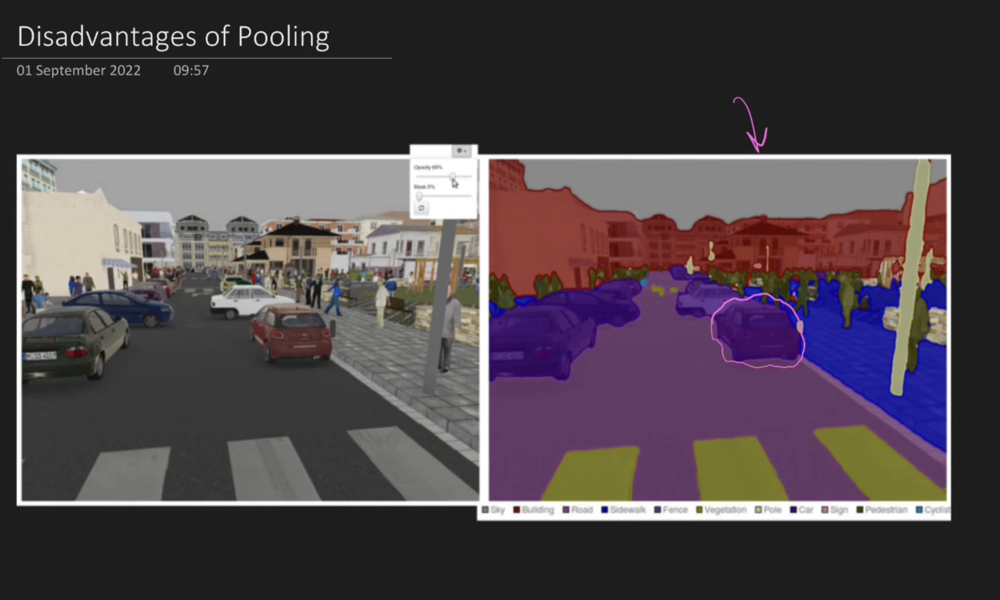
Knowing this trade‑off saves you from blindly adding pooling everywhere and ruining your model.

---

### 2. Detailed Explanation

#### A. Advantages of Pooling (Recap & Extend)

| Advantage | Explanation |
|-----------|-------------|
| **1. Reduces memory & computation** | Downsamples feature maps (e.g., 226×226 → 113×113), cutting memory usage by ~75% per pooling layer. |
| **2. Provides translation invariance** | Small shifts in feature position don't change the pooled output – network becomes location‑agnostic. |
| **3. Enhances dominant features** (MaxPooling only) | By picking the maximum in each local region, the network focuses on the most important patterns and suppresses noise. |
| **4. No trainable parameters** | Pooling is a fixed operation – no weights to learn, so training is faster and there's less risk of overfitting. |
| **5. Increases receptive field** | After pooling, subsequent convolution layers see a larger area of the original image, helping capture broader context. |

**Example of memory saving (from the transcript):**  
- Input: 228×228 image, 100 filters → feature map: 226×226×100.  
- With 32‑bit floats, that's ~20 MB per sample. For a batch, it can reach 1.5 GB.  
- After MaxPooling (2×2, stride 2), size becomes 113×113×100 → memory drops to ~5 MB per sample.

---

#### B. Limitations of Pooling

| Limitation | Explanation |
|------------|-------------|
| **1. Loss of spatial information** | Pooling discards exact positions of features. For tasks where location is critical, this is a deal‑breaker. |
| **2. Information loss** | With MaxPooling, you keep only the max value and throw away the rest – up to **75% of your data** is discarded per pooling layer. |
| **3. Not always useful** | Some modern architectures (e.g., certain GANs, segmentation networks) achieve better results **without** pooling, using only strided convolutions. |
| **4. Fixed operation – can't adapt** | Unlike convolution layers, pooling has no learnable parameters, so it can't adapt to the data – it always picks the max or average. |

**Quantifying information loss:**  
- With 2×2 pooling, stride 2, you keep only 1 out of 4 values (25% of the data).  
- After two pooling layers, you keep only 1/16 (~6.25%) of the original spatial information.

---

#### C. When to Use Pooling

| Scenario | Why it's good |
|----------|---------------|
| **Image classification** (cat vs. dog, digit recognition) | Location doesn't matter – only presence of features. Pooling gives translation invariance. |
| **Object detection** (early layers) | Helps reduce computation while keeping important features; later layers may use less pooling to retain position for bounding boxes. |
| **When you have limited GPU memory** | Pooling is the easiest way to shrink feature maps and fit your model into memory. |
| **When you want to prevent overfitting** | Global pooling at the end drastically reduces parameters, acting as a regularizer. |

---

#### D. When to Avoid Pooling

| Scenario | Why it's bad |
|----------|--------------|
| **Image segmentation** (pixel‑wise classification) | Every pixel's class matters – pooling loses boundary and location details, making segmentation inaccurate. |
| **Pose estimation** (detecting keypoints like joints) | Exact coordinates of features are essential; pooling can shift or lose keypoint positions. |
| **When you need fine‑grained details** | If your task requires high‑resolution output (e.g., super‑resolution, medical image analysis), pooling destroys necessary details. |
| **Modern alternatives are available** | Strided convolutions (convolution with stride > 1) can downsample without losing as much information, and some papers show they can replace pooling entirely. |

**Note from the transcript:**  
> *"There are some papers nearby where it has been shown that pooling is not required – without pooling, you can also make a good CNN by just applying the convolution layer with stride."*

---

### 3. Key Points

- **Main advantages:** memory reduction, translation invariance, feature enhancement (MaxPooling), no parameters.
- **Main disadvantage:** loss of spatial information and fine details.
- **Use pooling** for global tasks (classification, detection) where location is secondary.
- **Avoid pooling** for dense prediction tasks (segmentation, keypoint detection) where location is primary.
- Always consider whether your task cares about **"what"** (presence) or **"where"** (location).

---

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
|---------|---------------|---------------|
| Adding pooling in every layer without thinking | Some tasks (segmentation) suffer from too much downsampling. | Ask: "Does my final output need precise location?" If yes, use pooling sparingly. |
| Believing pooling is always beneficial | It always discards information – sometimes that info is crucial. | Experiment with and without pooling to see the impact on your specific task. |
| Using MaxPooling when AveragePooling would be better | If you want to retain background context, MaxPooling might be too aggressive. | Consider your goal: enhancement (use Max) vs. smoothing (use Average). |
| Forgetting that pooling reduces resolution | Subsequent convolution layers may miss small objects if resolution drops too fast. | Monitor your feature map sizes – don't shrink too quickly, especially for small objects. |

---

### 5. Interview / Exam Questions

**Q1:** Why is pooling not recommended for image segmentation tasks?  
**A:** Segmentation requires pixel‑wise classification. Pooling loses spatial information (exact positions), making it hard to assign correct labels to each pixel.

**Q2:** Can you replace pooling with something else?  
**A:** Yes, you can use **strided convolutions** (convolution with stride > 1) to downsample. Some modern architectures prefer this because it retains more learnable parameters and can be adapted during training.

**Q3:** What is the main advantage of using Global Average Pooling at the end of a CNN?  
**A:** It reduces the number of parameters dramatically (no dense layers needed), which helps prevent overfitting and makes the model more interpretable.

**Q4:** If you have a classification task, why is translation invariance good?  
**A:** Because you want to recognize an object (e.g., a cat) regardless of where it appears in the image. Translation invariance ensures the model focuses on the object's features, not its position.

**Q5:** How much information is lost with one MaxPooling layer (2×2, stride 2)?  
**A:** 75% of the spatial information – you keep only the maximum value from each 2×2 block and discard the other three.

---

### 6. Revision Notes (Quick Recap)

| Aspect | Summary |
|--------|---------|
| **Advantages** | Memory saving, translation invariance, dominant feature enhancement, no parameters. |
| **Disadvantages** | Loss of spatial info, discards up to 75% of data per layer. |
| **Best for** | Classification, detection (early layers), memory‑constrained environments. |
| **Avoid for** | Segmentation, pose estimation, tasks needing precise location. |
| **Alternative** | Strided convolutions can downsample without pooling. |
| **Takeaway** | Pooling is a powerful but lossy tool – choose wisely based on your task. |

---

**All topics from the transcript are now covered.** You've learned:
1. Introduction to Pooling & Why It's Needed
2. MaxPooling in Detail – Operation & Demo
3. AveragePooling, Global Pooling, and Pooling on Volumes
4. Advantages, Limitations, and When to Use (or Avoid) Pooling

